In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, accuracy_score, recall_score, precision_score, roc_auc_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import pandas as pd
from collections import defaultdict
from itertools import combinations
from matplotlib import rcParams
rcParams["figure.dpi"] = 100

## Параметры для разбиения на тестовую и обучающую выборки

In [2]:
TEST_SIZE = 0.33
RANDOM_STATE = 42

## Считываение исходных данных и разбиение на тестовую и обучающую выборки

In [4]:
df = pd.read_csv("data/SPFD.csv")
X = df[["StD", "TM"]].to_numpy()
Y = df["PF"].to_numpy()
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=TEST_SIZE, random_state=RANDOM_STATE)

## функция для рассчета предсказанных значений и метрик качества модели

In [6]:
def evaluate_models(model_generator, model_label, x_train, y_train, x_test, y_test):
    scores = defaultdict(list)
    predictions = []
    for model, args in model_generator:
        y_predict = model.fit(x_train, y_train).predict(x_test)
        predictions.append(y_predict)
        tn, fp, fn, tp = confusion_matrix(y_test, y_predict).ravel()
        scores['tn'].append(tn)
        scores['fp'].append(fp)
        scores['fn'].append(fn)
        scores['tp'].append(tp)
        scores['accuracy'].append(accuracy_score(y_test, y_predict))
        scores['recall'].append(recall_score(y_test, y_predict))
        scores['precision'].append(precision_score(y_test, y_predict))
        scores['roc_auc'].append(roc_auc_score(y_test, y_predict)),
        scores['model_label'].append(model_label)
        for arg, value in args.items():
            if(arg != 'random_state'):
                scores[arg].append(value)
    return predictions, pd.DataFrame(scores)

## функция для генерации моделей со всеми комбинациями заданых параметров (params)

In [7]:
def generate_parametrized_models(model_factory, params):
    param_names = list(params.keys())
    param_types = {param_name: type(params[param_name][0]) for param_name in param_names}
    for params_values_set in np.array(np.meshgrid(*params.values(), copy=False)).T.reshape(-1, len(param_names)):
        args = { param_name: param_types[param_name](params_values_set[i]) for i, param_name in enumerate(param_names) }
        yield model_factory(**args), args

## функция для построения графиков критериев качества модели

In [9]:
def visualize_model_scores(sc, params):
    params_keys = {k for k, v in params.items() if len(v) > 1}
    for param_name in params_keys:
        other_params = list(params_keys.difference([param_name]))
        for group_params, g in sc.groupby(by=other_params):
            g[g.columns.drop(other_params)].plot(x=param_name, subplots=True,figsize=(8, 6), layout=(4, -1), sharex=True)
            if isinstance(group_params, tuple):
                fixed_values = {v: group_params[i] for i,v in enumerate(other_params)}
            else:
                fixed_values = {v: group_params for i,v in enumerate(other_params)}
            plt.suptitle(f'{fixed_values}')
            plt.tight_layout()

## Параметры модели случайного леса без бутстрапирования выборки

In [10]:
random_forest_no_bootstrap_params= dict(n_estimators=list(range(50, 150, 25)), max_depth=list(range(2, 10, 2)), min_samples_split=[2, 4, 8], min_weight_fraction_leaf=[0.0, 0.01, 0.05, 0.1, 0.15], random_state=[42], bootstrap=[False] )

## Параметры модели случайного леса с бутстрапированием выборки

In [24]:
random_forest_with_bootstrap_params = dict(n_estimators=[50], bootstrap=[True], max_samples=[0.5, 0.6, 0.7, 0.8, 0.9], min_weight_fraction_leaf = [0.0], max_depth=[6], random_state=[42], min_samples_split=[2], oob_score=[False, True] )

## вычисление критериев качества для моделей случайного леса без бутстраприрования выборки

In [20]:
_, rf_nb_scores = evaluate_models(generate_parametrized_models(RandomForestClassifier, random_forest_no_bootstrap_params), 'RandomForestNoBootstrap', x_train, y_train, x_test, y_test )

## вычисление критериев качества для моделей случайного леса с бутстрапрированием выборки

In [21]:
_, rf_wb_scores = evaluate_models(generate_parametrized_models(RandomForestClassifier, random_forest_with_bootstrap_params), 'RandomForestWithBootstrap', x_train, y_train, x_test, y_test )

## Распечатка критериев качества моделей случайного леса

In [41]:
for g, df in pd.concat([rf_nb_scores,rf_wb_scores]).groupby('model_label'):
    display(df.sort_values(by='roc_auc', ascending=False).head())

,tn,fp,fn,tp,accuracy,recall,precision,roc_auc,model_label,n_estimators,max_depth,min_samples_split,min_weight_fraction_leaf,bootstrap,max_samples,oob_score
43,174,2,0,154,0.9939,1.0000,0.9872,0.9943,RandomForestNoBootstrap,100,8,8,0.0000,False,NaN,NaN
15,174,2,0,154,0.9939,1.0000,0.9872,0.9943,RandomForestNoBootstrap,125,8,2,0.0000,False,NaN,NaN
42,174,2,0,154,0.9939,1.0000,0.9872,0.9943,RandomForestNoBootstrap,100,6,8,0.0000,False,NaN,NaN
39,174,2,0,154,0.9939,1.0000,0.9872,0.9943,RandomForestNoBootstrap,75,8,8,0.0000,False,NaN,NaN
38,174,2,0,154,0.9939,1.0000,0.9872,0.9943,RandomForestNoBootstrap,75,6,8,0.0000,False,NaN,NaN


,tn,fp,fn,tp,accuracy,recall,precision,roc_auc,model_label,n_estimators,max_depth,min_samples_split,min_weight_fraction_leaf,bootstrap,max_samples,oob_score
3,172,4,0,154,0.9879,1.0000,0.9747,0.9886,RandomForestWithBootstrap,50,6,2,0.0000,True,0.8000,False
8,172,4,0,154,0.9879,1.0000,0.9747,0.9886,RandomForestWithBootstrap,50,6,2,0.0000,True,0.8000,True
0,171,5,0,154,0.9848,1.0000,0.9686,0.9858,RandomForestWithBootstrap,50,6,2,0.0000,True,0.5000,False
1,171,5,0,154,0.9848,1.0000,0.9686,0.9858,RandomForestWithBootstrap,50,6,2,0.0000,True,0.6000,False
2,171,5,0,154,0.9848,1.0000,0.9686,0.9858,RandomForestWithBootstrap,50,6,2,0.0000,True,0.7000,False


## отображение сводной таблицы с параметрами лучших моделей

### выбор лучших наборов параметров моделей без бутстрапирования выборки по критерию качества roc_auc

In [36]:
rf_nb_best_roc_auc = rf_nb_scores[rf_nb_scores['roc_auc']==rf_nb_scores['roc_auc'].max()]

### выбор лучших наборов параметров моделей c бутстрапированием выборки по критерию качества roc_auc

In [34]:
rf_wb_best_roc_auc = rf_wb_scores[rf_wb_scores['roc_auc']==rf_wb_scores['roc_auc'].max()]

In [45]:
pd.options.display.float_format = '{:,.4f}'.format
pd.concat([rf_nb_best_roc_auc, rf_wb_best_roc_auc]).set_index('model_label').head(10)

,tn,fp,fn,tp,accuracy,recall,precision,roc_auc,n_estimators,max_depth,min_samples_split,min_weight_fraction_leaf,bootstrap,max_samples,oob_score
model_label,,,,,,,,,,,,,,,
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,50,6,2,0.0000,False,NaN,NaN
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,50,8,2,0.0000,False,NaN,NaN
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,75,6,2,0.0000,False,NaN,NaN
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,75,8,2,0.0000,False,NaN,NaN
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,100,6,2,0.0000,False,NaN,NaN
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,100,8,2,0.0000,False,NaN,NaN
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,125,6,2,0.0000,False,NaN,NaN
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,125,8,2,0.0000,False,NaN,NaN
RandomForestNoBootstrap,174,2,0,154,0.9939,1.0000,0.9872,0.9943,50,6,4,0.0000,False,NaN,NaN


### визуализация вычисленных критериев качества для моделей без бутстрапирования выборки
### визуализация вычисленных критериев качества для моделей с бутстрапированием выборки

h:\Program Data\Documents\Visual Studio 2019\Projects\tris\venv\lib\site-packages\pandas\plotting\_matplotlib\tools.py:196: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


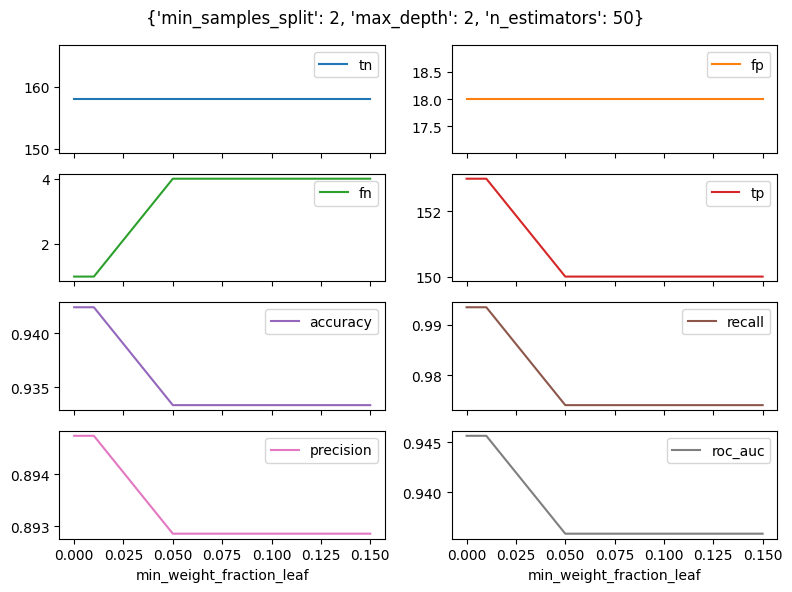

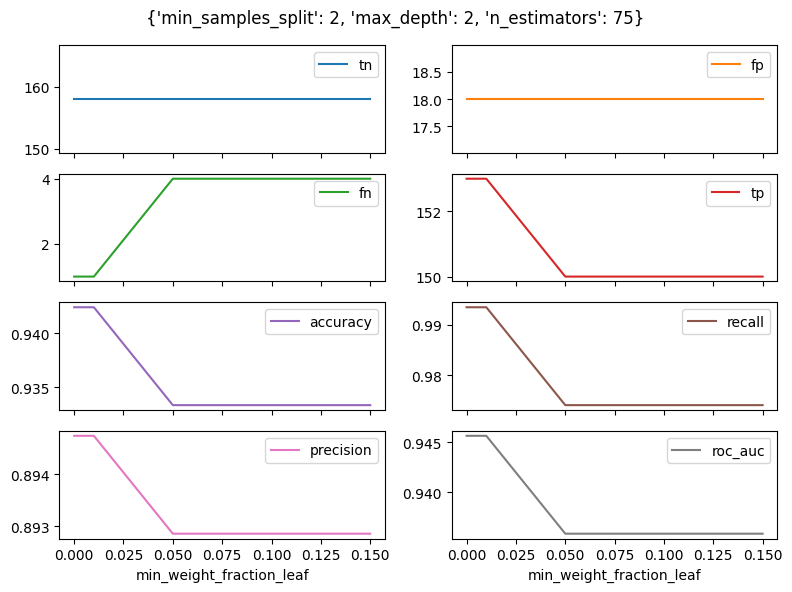

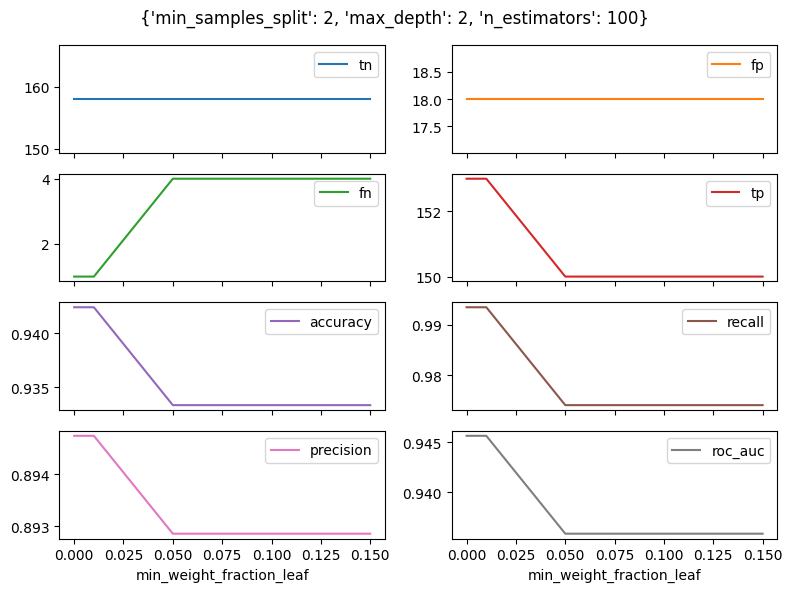

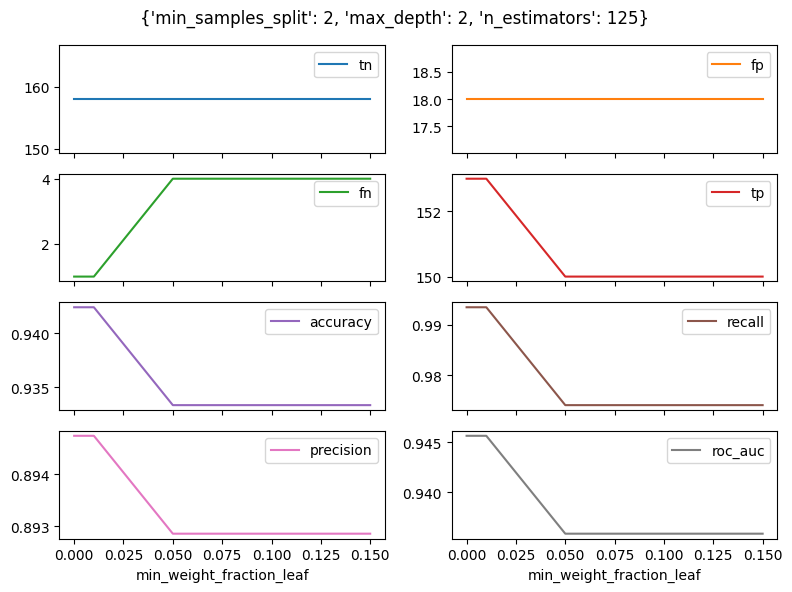

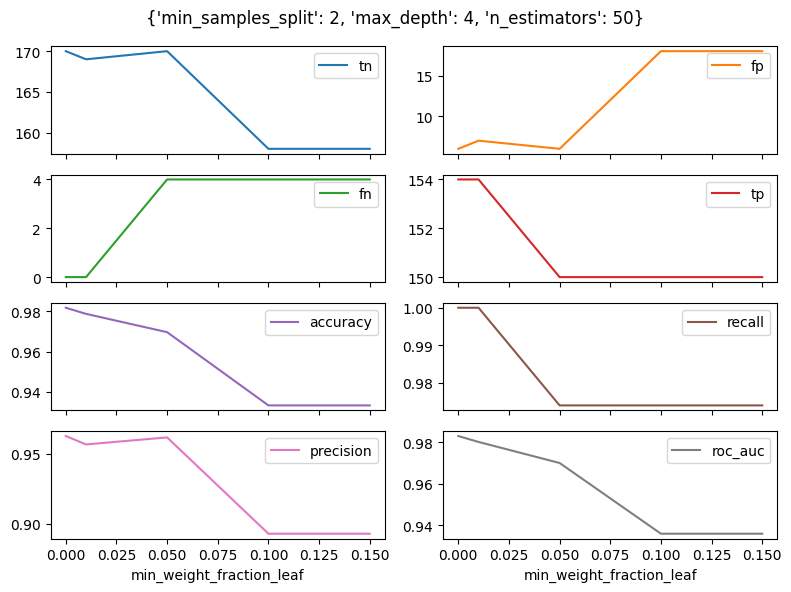

...

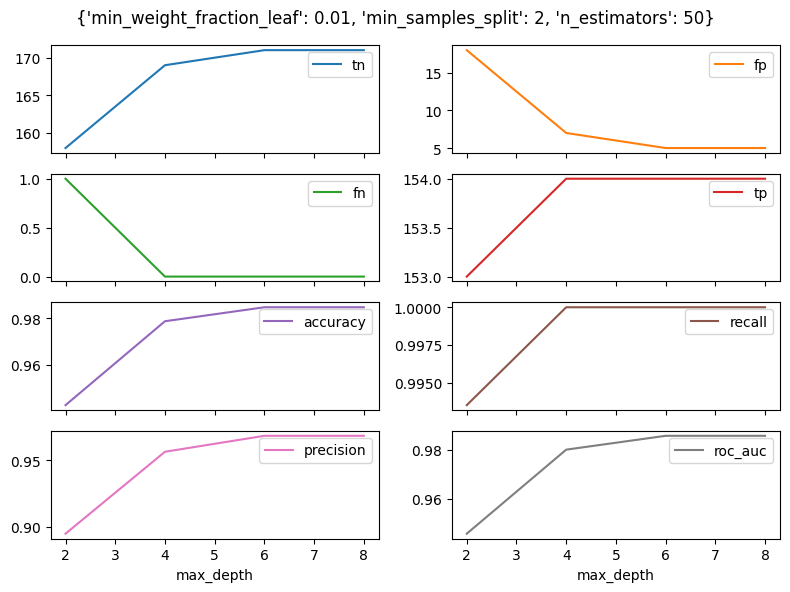

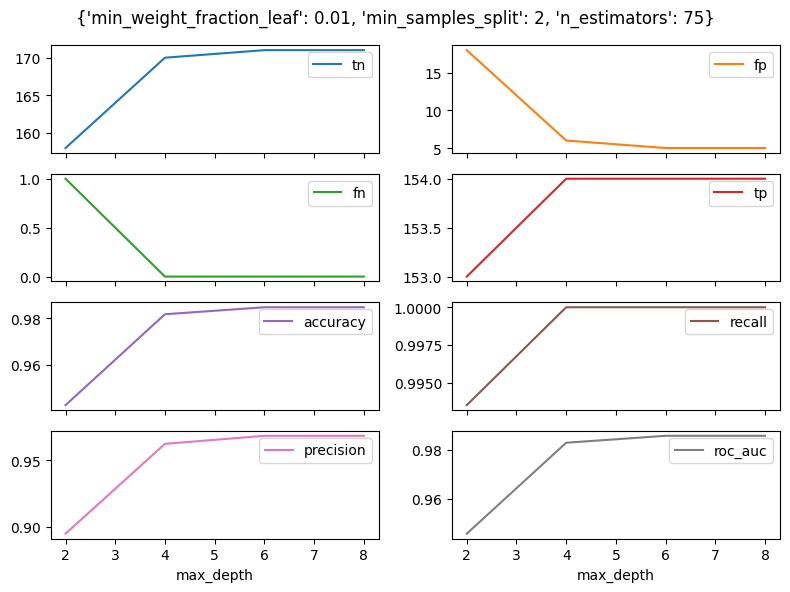

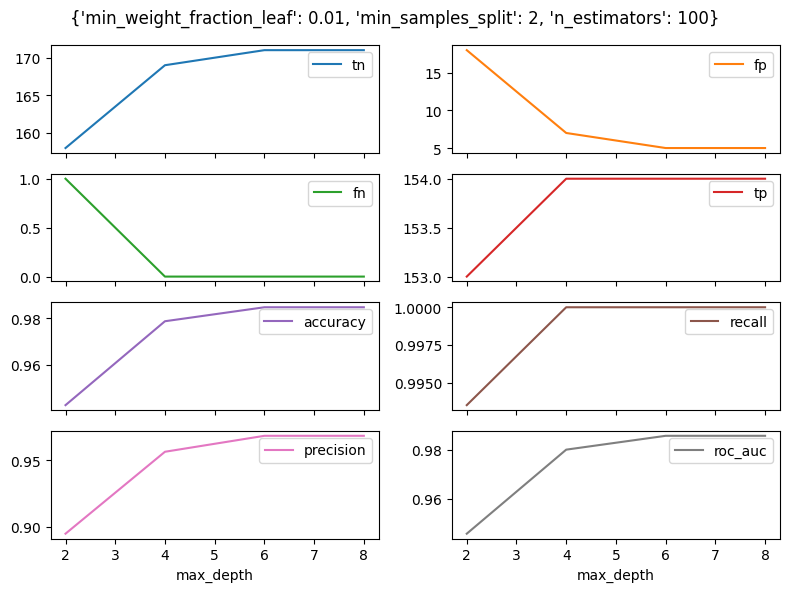

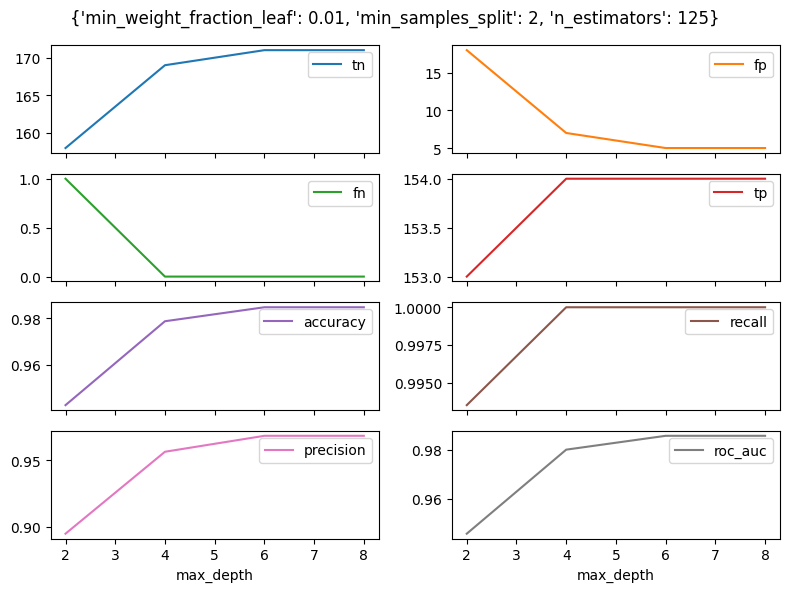

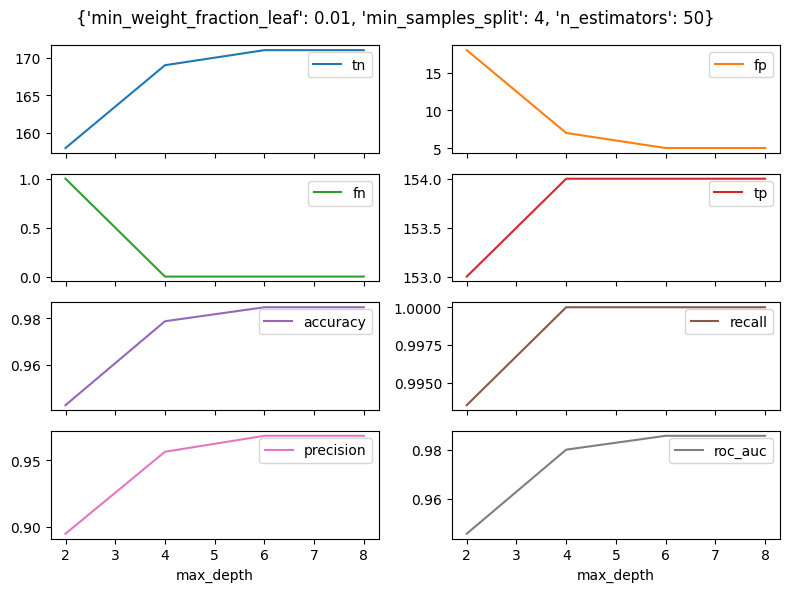

Error in callback <function flush_figures at 0x000001E65F0FA700> (for post_execute):


KeyboardInterrupt: 

In [14]:
visualize_model_scores(rf_nb_scores, random_forest_no_bootstrap_params)
visualize_model_scores(rf_wb_scores, random_forest_with_bootstrap_params)